<a href="https://colab.research.google.com/github/vibhugupta1/C4MTS-Task2-Baseline/blob/main/C4MTS_TASK2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive/')
# %mkdir /content/drive/MyDrive/myNewfolder
%cd /content/drive/MyDrive

Mounted at /content/drive/
/content/drive/MyDrive


In [2]:
import torch
import numpy as np

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if not train_on_gpu:
  print('CUDA is not available.  Training on CPU ...')
else:
  print('CUDA is available!  Training on GPU ...')

CUDA is available!  Training on GPU ...


['right-hand-curve', 'gap-in-median', 'side-road-left', 'left-hand-curve']


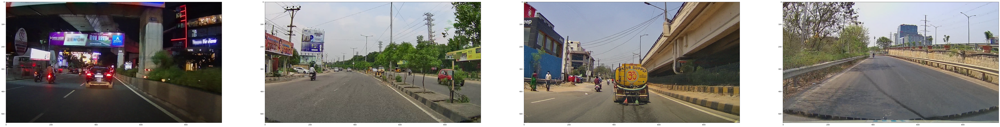

In [4]:
%matplotlib inline
import matplotlib.pyplot as plt
import os
src_path = "/content/drive/MyDrive/task2train540p/"
sub_class = os.listdir(src_path)
lhc = os.listdir(os.path.join(src_path,sub_class[0]))
gip = os.listdir(os.path.join(src_path,sub_class[1]))
srl = os.listdir(os.path.join(src_path,sub_class[2]))
rhc = os.listdir(os.path.join(src_path,sub_class[3]))
print(sub_class)
fig = plt.figure(figsize=(100,100))
path = os.path.join(src_path,sub_class[0])
for i in range(0,1):
    plt.subplot(240 + 1 + i)
    img = plt.imread(os.path.join(path,lhc[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[1])
for i in range(0,1):
    plt.subplot(240 + 2 + i)
    img = plt.imread(os.path.join(path,gip[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[2])
for i in range(0,1):
    plt.subplot(240 + 3 + i)
    img = plt.imread(os.path.join(path,srl[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))
path = os.path.join(src_path,sub_class[3])
for i in range(0,1):
    plt.subplot(240 + 4 + i)
    img = plt.imread(os.path.join(path,rhc[0]))
    plt.imshow(img, cmap=plt.get_cmap('gray'))

In [14]:
from torchvision import datasets
import torchvision.transforms as transforms
from torch.utils.data.sampler import SubsetRandomSampler
from torch.utils.data import DataLoader

# number of subprocesses to use for data loading
num_workers = 0
# how many samples per batch to load
batch_size = 10
# percentage of training set to use as validation
valid_size = 0.2

# convert data to a normalized torch.FloatTensor
print('==> Preparing data..')
#Image augmentation is used to train the model
transform_train = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])
#Only the data is normalaized we do not need to augment the test data
transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

# choose the training and test datasets
train_data = datasets.ImageFolder("/content/drive/MyDrive/task2train540p", transform=transform_train)
# test_data = datasets.ImageFolder("/content/drive/MyDrive/task2test", transform=transform_test)

# obtain training indices that will be used for validation
num_train = len(train_data)
print(num_train)
indices = list(range(num_train))
np.random.shuffle(indices)
split = int(np.floor(valid_size * num_train))
train_idx, valid_idx = indices[split:], indices[:split]

# define samplers for obtaining training and validation batches
train_sampler = SubsetRandomSampler(train_idx)
valid_sampler = SubsetRandomSampler(valid_idx)

# prepare data loaders (combine dataset and sampler)
train_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size,
    sampler=train_sampler, num_workers=num_workers)
valid_loader = torch.utils.data.DataLoader(train_data, batch_size=batch_size, 
    sampler=valid_sampler, num_workers=num_workers)
# test_loader = torch.utils.data.DataLoader(test_data, batch_size=batch_size, num_workers=num_workers)

# specify the image classes
classes = ['gap-in-median','left-hand-curve','right-hand-curve','side-road-left']

==> Preparing data..
1000


In [18]:
import torch.backends.cudnn as cudnn
import torch.nn as nn
import torch.nn.functional as F

class BasicBlock(nn.Module):
  expansion = 1
  def __init__(self, in_planes, planes, stride=1):
    super(BasicBlock, self).__init__()
    self.conv1 = nn.Conv2d(in_planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn1 = nn.BatchNorm2d(planes)
    self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=1, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(planes)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_planes != self.expansion*planes:
      self.shortcut = nn.Sequential(
          nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
          nn.BatchNorm2d(self.expansion*planes)
      )
  
  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = self.bn2(self.conv2(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class BottleNeck(nn.Module):
  expansion = 4

  def __init__(self, in_planes, planes, stride=1):
    super(BottleNeck, self).__init__()
    self.conv1 = nn.Conv2d(in_planes , planes, kernel_size=1, bias=False)
    self.bn1 = nn.BatchNorm2d(planes)
    self.conv2 = nn.Conv2d(planes, planes, kernel_size=3, stride=stride, padding=1, bias=False)
    self.bn2 = nn.BatchNorm2d(planes)
    self.conv3 = nn.Conv2d(planes, self.expansion*planes, kernel_size=1, bias=False)
    self.bn3 = nn.BatchNorm2d(self.expansion*planes)

    self.shortcut = nn.Sequential()
    if stride != 1 or in_planes != self.expansion*planes :
      self.shortcut = nn.Sequential(
          nn.Conv2d(in_planes, self.expansion*planes, kernel_size=1, stride=stride, bias=False),
          nn.BatchNorm2d(self.expansion*planes)
      )

  def forward(self, x):
    out = F.relu(self.bn1(self.conv1(x)))
    out = F.relu(self.bn2(self.conv2(out)))
    out = self.bn3(self.conv3(out))
    out += self.shortcut(x)
    out = F.relu(out)
    return out

class ResNet(nn.Module):
  def __init__(self, block, num_blocks, num_classes=4):
    super(ResNet, self).__init__()
    self.in_planes = 64

    self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3, bias=False)
    self.bn1 = nn.BatchNorm2d(64)
    self.layer1 = self._make_layer(block, 64, num_blocks[0], stride=1)
    self.layer2 = self._make_layer(block, 128, num_blocks[1], stride=2)
    self.layer3 = self._make_layer(block, 256, num_blocks[2], stride=2)
    self.layer4 = self._make_layer(block, 512, num_blocks[3], stride=2)
    self.linear = nn.Linear(512*4, num_classes)

  def _make_layer(self, block, planes, num_blocks, stride):
    strides = [stride] + [1]*(num_blocks-1)
    layers = []
    for stride in strides:
      layers.append(block(self.in_planes, planes, stride))
      self.in_planes = planes * block.expansion      
    return nn.Sequential(*layers)

  def forward(self, x):
    # print(x.shape)
    out = F.relu(self.bn1(self.conv1(x)))
    out = self.layer1(out)
    out = self.layer2(out)
    out = self.layer3(out)
    out = self.layer4(out)
    out = F.avg_pool2d(out, (17,30))
    out = out.view(out.size(0), -1)
    out = self.linear(out)
    return out

ResNet18 = ResNet(BasicBlock, [1,1,1,1])
#ResNet34 = ResNet(BasicBlock, [3,4,6,3])
#ResNet50 = ResNet(BottleNeck, [3,4,6,3])
#ResNet101 = ResNet(BottleNeck, [3,4,23,3])
#ResNet152 = ResNet(BottleNeck, [3,8,36,3])

print(ResNet18)

if train_on_gpu:
  ResNet18 = torch.nn.DataParallel(ResNet18)
  cudnn.benchmark = True

ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (shortcut): Sequential()
    )
  )
  (layer2): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(128,

In [19]:
import torch.optim as optim
# specify loss function (categorical cross-entropy)
criterion = nn.CrossEntropyLoss()

# specify optimizer
optimizer = optim.SGD(ResNet18.parameters(), lr=0.0008, momentum=0.9, weight_decay=0.000001)

In [20]:
# number of epochs to train the model
n_epochs = 100

Resnet18 = torch.load("ResNet18.pt")

valid_loss_min = np.Inf # track change in validation loss


for epoch in range(1, n_epochs+1):
  # keep track of training and validation loss
  train_loss = 0.0
  valid_loss = 0.0
    
  ###################
  # train the model #
  ###################
  ResNet18.train()
  for batch_idx, (data, target) in enumerate(train_loader):
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    # clear the gradients of all optimized variables
    optimizer.zero_grad()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = ResNet18(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # backward pass: compute gradient of the loss with respect to model parameters
    loss.backward()
    # perform a single optimization step (parameter update)
    optimizer.step()
    # update training loss
    train_loss += loss.item()*data.size(0)
        
  ######################    
  # validate the model #
  ######################
  ResNet18.eval()
  for batch_idx, (data, target) in enumerate(valid_loader):
    # move tensors to GPU if CUDA is available
    if train_on_gpu:
      data, target = data.cuda(), target.cuda()
    # forward pass: compute predicted outputs by passing inputs to the model
    output = ResNet18(data)
    # calculate the batch loss
    loss = criterion(output, target)
    # update average validation loss 
    valid_loss += loss.item()*data.size(0)
    
  # calculate average losses
  train_loss = train_loss/len(train_loader.sampler)
  valid_loss = valid_loss/len(valid_loader.sampler)
        
  # print training/validation statistics 
  print('Epoch: {} \tTraining Loss: {:.6f} \tValidation Loss: {:.6f}'.format(
      epoch, train_loss, valid_loss))
    
  # save model if validation loss has decreased
  if valid_loss <= valid_loss_min:
    print('Validation loss decreased ({:.6f} --> {:.6f}).  Saving model ...'.format(
    valid_loss_min,
    valid_loss))
    torch.save(ResNet18.state_dict(), 'ResNet18.pt')
    valid_loss_min = valid_loss

Epoch: 1 	Training Loss: 1.350262 	Validation Loss: 1.375703
Validation loss decreased (inf --> 1.375703).  Saving model ...
Epoch: 2 	Training Loss: 1.213078 	Validation Loss: 1.372508
Validation loss decreased (1.375703 --> 1.372508).  Saving model ...
Epoch: 3 	Training Loss: 1.130712 	Validation Loss: 1.344107
Validation loss decreased (1.372508 --> 1.344107).  Saving model ...
Epoch: 4 	Training Loss: 1.151567 	Validation Loss: 1.050611
Validation loss decreased (1.344107 --> 1.050611).  Saving model ...
Epoch: 5 	Training Loss: 1.036941 	Validation Loss: 1.330848
Epoch: 6 	Training Loss: 1.024577 	Validation Loss: 0.990714
Validation loss decreased (1.050611 --> 0.990714).  Saving model ...
Epoch: 7 	Training Loss: 0.926973 	Validation Loss: 0.988532
Validation loss decreased (0.990714 --> 0.988532).  Saving model ...
Epoch: 8 	Training Loss: 0.935649 	Validation Loss: 1.090063
Epoch: 9 	Training Loss: 0.867499 	Validation Loss: 0.977051
Validation loss decreased (0.988532 --> 0.

In [21]:
ResNet18.load_state_dict(torch.load('ResNet18.pt'))

<All keys matched successfully>

In [26]:
import os
import numpy as np
from PIL import Image
import torch
from torchvision import transforms

classes = ['gap-in-median','left-hand-curve','right-hand-curve','side-road-left']

test_folder = "/content/drive/MyDrive/task2test" 
batch_size = 10

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize([0.4914, 0.4822, 0.4465], [0.2023, 0.1994, 0.2010])
])

k=list(range(0,len(os.listdir(test_folder))))
m=0

preprocessed_images = []
predictions_list = []

for filename in os.listdir(test_folder):
    image_path = os.path.join(test_folder, filename)
    image = Image.open(image_path)
    preprocessed_image = transform_test(image)
    preprocessed_images.append(preprocessed_image)
    if len(preprocessed_images) == batch_size:
        preprocessed_images = torch.stack(preprocessed_images)
        predictions = ResNet18(preprocessed_images)
        for i in range(len(predictions)):
            predicted_class = torch.argmax(predictions[i])
            confidence_score = torch.max(torch.softmax(predictions[i], dim=0))
            print(f"Prediction for Test Image {k[m]+1}: Class {predicted_class.item()}, Confidence: {confidence_score.item()}")
            f=open(f"{k[m]+1}.txt",'w')
            f.write(f"{classes[predicted_class.item()]}, {format(confidence_score.item(),'.2f')} ")
            m+=1
        preprocessed_images = []

Prediction for Test Image 1: Class 0, Confidence: 0.9914339780807495
Prediction for Test Image 2: Class 0, Confidence: 0.9371099472045898
Prediction for Test Image 3: Class 0, Confidence: 0.9710684418678284
Prediction for Test Image 4: Class 2, Confidence: 0.5661779046058655
Prediction for Test Image 5: Class 0, Confidence: 0.9954423904418945
Prediction for Test Image 6: Class 0, Confidence: 0.9892534613609314
Prediction for Test Image 7: Class 0, Confidence: 0.9902299046516418
Prediction for Test Image 8: Class 0, Confidence: 0.9980727434158325
Prediction for Test Image 9: Class 3, Confidence: 0.6497600674629211
Prediction for Test Image 10: Class 0, Confidence: 0.9841524958610535
Prediction for Test Image 11: Class 2, Confidence: 0.9906518459320068
Prediction for Test Image 12: Class 0, Confidence: 0.9975355863571167
Prediction for Test Image 13: Class 0, Confidence: 0.9381654262542725
Prediction for Test Image 14: Class 0, Confidence: 0.8901721835136414
Prediction for Test Image 15:

In [27]:
for i in range(200):
    x=open(f"{i+1}.txt",'r')
    a=x.read().split(',')[0]
    f=open("predictions_final_subclasses.txt",'a')
    f.write(f"{i+1}.png {a}\n")
    f.close()